<a href="https://colab.research.google.com/github/xAn-x/Vision-Lab/blob/master/04_Conditional_VAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install lightning -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.5/869.5 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 9.7 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# sns.set_style("whitegrid")

import torch
import torch.nn as nn
import torch.nn.functional as F
import lightning as L

In [3]:
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

In [4]:
from torchvision import datasets
from torchvision import transforms as T
from torch.utils.data import DataLoader
from pathlib import Path


train_ds=datasets.MNIST(root="data",train=True,download=True,transform=T.ToTensor())
valid_ds=datasets.MNIST(root="data",train=False,download=False,transform=T.ToTensor())

len(train_ds),len(valid_ds)

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9912422/9912422 [00:01<00:00, 5093019.20it/s]


Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28881/28881 [00:00<00:00, 135513.09it/s]


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1648877/1648877 [00:01<00:00, 1265363.57it/s]


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4542/4542 [00:00<00:00, 9968879.52it/s]


Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



(60000, 10000)

In [5]:
train_dl=DataLoader(train_ds,batch_size=64,shuffle=True,pin_memory=True,num_workers=2)
valid_dl=DataLoader(valid_ds,batch_size=128,shuffle=False,pin_memory=True,num_workers=2)

len(train_dl),len(valid_dl)

(938, 79)

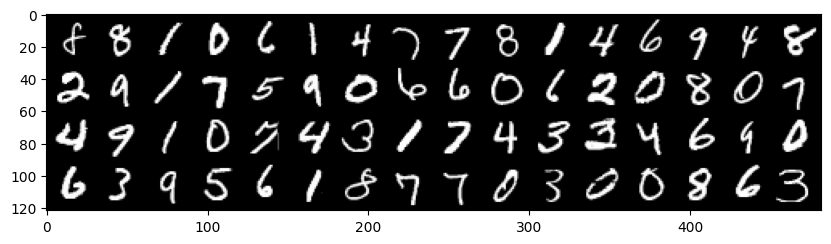

In [6]:
from torchvision.utils import make_grid

for images,labels in train_dl:
  grid=make_grid(images,nrow=16)
  plt.figure(figsize=(10,12))
  plt.imshow(grid.permute(1,2,0))
  break

In [45]:
import torch.optim as optim
from collections import defaultdict

class Dense(nn.Module):
  def __init__(self, in_features, out_features, dropout=0.2):
    super().__init__()
    self.dense = nn.Sequential(
      nn.Linear(in_features, out_features),
      nn.SELU(inplace=True),
      nn.BatchNorm1d(out_features),
      nn.Dropout(dropout)
    )

  def forward(self,X:torch.Tensor)->torch.Tensor:
    return self.dense(X)



class ConditionalVAE(L.LightningModule):
  def __init__(self,encoder_config:list[tuple[int,int]]|tuple[tuple[int,int]],latent_dim:int,decoder_config:list[tuple[int,int]]|tuple[tuple[int,int]],num_classes=10,dropout=0.2):
    super().__init__()
    self.latent_dim = latent_dim
    self.num_classes = num_classes
    self.alpha=0.001
    assert decoder_config[0][0] == latent_dim+num_classes,f"Invalid input dimensions of decoder, must be :(latent_dim+num_classes)[f{latent_dim+num_classes}]"


    self.encoder = nn.Sequential(*[Dense(in_features, out_features,dropout=dropout) for in_features, out_features in encoder_config])

    self.z_mean=nn.LazyLinear(latent_dim)
    self.z_log_var=nn.LazyLinear(latent_dim)

    decoder=[Dense(in_features, out_features,dropout=dropout) for in_features, out_features in decoder_config]
    decoder.append(nn.Sigmoid())
    self.decoder = nn.Sequential(*decoder)

    self.history=defaultdict(list)
    self.temp_history=defaultdict(list)


  def reparameterize(self,mu, log_var):
    eps=torch.rand_like(mu).to(mu.device)
    return mu + torch.exp(0.5 * log_var) * eps

  def decode(self,z,labels):
    labels=labels.long()
    recontructed_x=torch.cat([z,F.one_hot(labels,num_classes=self.num_classes)],dim=-1)
    return recontructed_x

  def forward(self,X,Y):
    inp_shape=X.shape
    X=X.view(X.shape[0],-1)
    X = self.encoder(X)

    z_mean = self.z_mean(X)
    z_log_var = self.z_log_var(X)
    z=self.reparameterize(z_mean, z_log_var)

    recontructed_x=self.decode(z,Y)
    X = self.decoder(recontructed_x)
    X=X.view(inp_shape)

    return X,z_mean, z_log_var

  def configure_optimizers(self, lr=3e-4):
    optimizer = optim.Adam(self.parameters(), lr=lr)
    scheduler = {
      'scheduler': optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=0, verbose=True),
      'monitor': 'val_loss'
    }
    return [optimizer], [scheduler]


  def common_step(self, batch, split):
    X, y = batch
    out, z_mean, z_log_var = self(X,y)

    reconstruction_loss=F.mse_loss(X, out)
    kl_loss = -0.5 * torch.sum(1 + z_log_var - z_mean.pow(2) - z_log_var.exp())
    kl_loss=torch.mean(kl_loss)
    loss = reconstruction_loss + self.alpha * kl_loss

    self.log(f'{split}_loss', loss)
    self.log(f'{split}_reconstruction_loss', reconstruction_loss)
    self.log(f'{split}_kl_loss', kl_loss)

    self.temp_history[f'{split}_loss'].append(loss.detach().cpu().item())
    self.temp_history[f'{split}_reconstruction_loss'].append(reconstruction_loss.detach().cpu().item())
    self.temp_history[f'{split}_kl_loss'].append(kl_loss.detach().cpu().item())

    return loss

  def training_step(self, batch, batch_idx):
    loss=self.common_step(batch,'train')
    return loss

  def validation_step(self, batch, batch_idx):
    if batch_idx==0:
      out,z_mean, z_log_var = self(*batch)
      gen_images=make_grid(out,nrow=16)
      self.logger.experiment.add_image('generated_images',gen_images,self.current_epoch)
      self.history["generated_images"].append(gen_images)

    loss=self.common_step(batch,'val')
    return loss

  def on_train_epoch_end(self):
    self.on_epoch_end('train')

  def on_validation_epoch_end(self):
    self.on_epoch_end('val')

  def on_epoch_end(self ,split: str):
    for loss in ['loss','reconstruction_loss','kl_loss']:
      name=f"{split}_{loss}"
      l=np.mean(np.array(self.temp_history[f"{split}_{loss}"]))
      print(f"{name}:{l.item():.4f}")
      self.history[name].append(l)
      self.temp_history[name].clear()
    print()
    if(split=='train'):
      print("*"*30)


  def predict_step(self, X,labels:None) -> torch.Tensor:
    if labels is None:
      labels = torch.randint(low=0, high=self.num_classes, size=(X.shape[0],)).to(X.device)
    X, z_mean, z_log_var = self(X,labels)
    return X,labels

In [46]:
encoder_config = [(784, 96), (96, 128), (128, 64),(64,8)]
latent_dim=16
num_classes=10
decoder_config = [(latent_dim+num_classes, 64), (64,96), (96,128), (128, 784)]


model=ConditionalVAE(encoder_config,latent_dim,decoder_config,num_classes).to(DEVICE)
model

ConditionalVAE(
  (encoder): Sequential(
    (0): Dense(
      (dense): Sequential(
        (0): Linear(in_features=784, out_features=96, bias=True)
        (1): SELU(inplace=True)
        (2): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.2, inplace=False)
      )
    )
    (1): Dense(
      (dense): Sequential(
        (0): Linear(in_features=96, out_features=128, bias=True)
        (1): SELU(inplace=True)
        (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.2, inplace=False)
      )
    )
    (2): Dense(
      (dense): Sequential(
        (0): Linear(in_features=128, out_features=64, bias=True)
        (1): SELU(inplace=True)
        (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.2, inplace=False)
      )
    )
    (3): Dense(
      (dense): Sequential(
        (0): Linear(in_features=64, out_featu

In [9]:
imgs=torch.randn((2,1,28,28)).to(DEVICE)
labels=torch.randint(0,10,(2,)).to(DEVICE)

out,mu,var=model(imgs,labels)
out.shape,mu.shape,var.shape

(torch.Size([2, 1, 28, 28]), torch.Size([2, 16]), torch.Size([2, 16]))

In [10]:
print(f"Encoder-params:{sum([p.numel() for p in model.encoder.parameters()])}")
print(f"Decoder-params:{sum([p.numel() for p in model.decoder.parameters()])}")
print(f"Total-params:{sum([p.numel() for p in model.parameters()])}")

Encoder-params:97144
Decoder-params:123664
Total-params:221096


In [ ]:
# import shutil
# shutil.rmtree("logs")

In [47]:
from lightning import Trainer
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint

logger = TensorBoardLogger(save_dir="logs", name="ConditionalVAE")
callbacks=[EarlyStopping(monitor='val_loss', patience=3, mode='min',min_delta=0.001),ModelCheckpoint(monitor='val_loss', save_top_k=1, mode='min',verbose=False,dirpath='checkpoints')]
trainer = Trainer(accelerator=DEVICE,devices='auto', max_epochs=40, logger=logger, callbacks=callbacks,fast_dev_run=False,strategy='auto')

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [48]:
trainer.fit(model,train_dl,valid_dl)

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/checkpoints exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
INFO: 
  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | Sequential | 97.1 K | train
1 | z_mean    | LazyLinear | 0      | train
2 | z_log_var | LazyLinear | 0      | train
3 | decoder   | Sequential | 123 K  | train
-------------------------------------------------
220 K     Trainable params
0         Non-trainable params
220 K     Total params
0.883     Total estimated model params size (MB)
53        Modules in train mode
0         Modules in eval m

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

val_loss:0.3162
val_reconstruction_loss:0.2278
val_kl_loss:88.3479



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.1797
val_reconstruction_loss:0.1775
val_kl_loss:2.1871

train_loss:0.2859
train_reconstruction_loss:0.2153
train_kl_loss:70.5551

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.1569
val_reconstruction_loss:0.1568
val_kl_loss:0.1428

train_loss:0.1840
train_reconstruction_loss:0.1749
train_kl_loss:9.0875

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.1119
val_reconstruction_loss:0.1119
val_kl_loss:0.0416

train_loss:0.1535
train_reconstruction_loss:0.1516
train_kl_loss:1.9271

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0987
val_reconstruction_loss:0.0987
val_kl_loss:0.0098

train_loss:0.1305
train_reconstruction_loss:0.1301
train_kl_loss:0.3664

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0902
val_reconstruction_loss:0.0902
val_kl_loss:0.0407

train_loss:0.1201
train_reconstruction_loss:0.1200
train_kl_loss:0.0723

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0870
val_reconstruction_loss:0.0870
val_kl_loss:0.0025

train_loss:0.1142
train_reconstruction_loss:0.1142
train_kl_loss:0.0192

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0849
val_reconstruction_loss:0.0849
val_kl_loss:0.0004

train_loss:0.1080
train_reconstruction_loss:0.1080
train_kl_loss:0.0047

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0827
val_reconstruction_loss:0.0827
val_kl_loss:0.0002

train_loss:0.1048
train_reconstruction_loss:0.1048
train_kl_loss:0.0010

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0814
val_reconstruction_loss:0.0814
val_kl_loss:0.0001

train_loss:0.1037
train_reconstruction_loss:0.1037
train_kl_loss:0.0003

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0813
val_reconstruction_loss:0.0813
val_kl_loss:0.0001

train_loss:0.1032
train_reconstruction_loss:0.1032
train_kl_loss:0.0002

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0812
val_reconstruction_loss:0.0812
val_kl_loss:0.0001

train_loss:0.1031
train_reconstruction_loss:0.1031
train_kl_loss:0.0002

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0808
val_reconstruction_loss:0.0808
val_kl_loss:0.0001

train_loss:0.1030
train_reconstruction_loss:0.1030
train_kl_loss:0.0001

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0798
val_reconstruction_loss:0.0798
val_kl_loss:0.0002

train_loss:0.1025
train_reconstruction_loss:0.1025
train_kl_loss:0.0001

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0775
val_reconstruction_loss:0.0775
val_kl_loss:0.0003

train_loss:0.1015
train_reconstruction_loss:0.1015
train_kl_loss:0.0002

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0745
val_reconstruction_loss:0.0745
val_kl_loss:0.0005

train_loss:0.0998
train_reconstruction_loss:0.0998
train_kl_loss:0.0003

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0708
val_reconstruction_loss:0.0708
val_kl_loss:0.0012

train_loss:0.0979
train_reconstruction_loss:0.0979
train_kl_loss:0.0004

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0672
val_reconstruction_loss:0.0672
val_kl_loss:0.0010

train_loss:0.0959
train_reconstruction_loss:0.0959
train_kl_loss:0.0004

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0641
val_reconstruction_loss:0.0641
val_kl_loss:0.0010

train_loss:0.0942
train_reconstruction_loss:0.0942
train_kl_loss:0.0004

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0615
val_reconstruction_loss:0.0615
val_kl_loss:0.0021

train_loss:0.0929
train_reconstruction_loss:0.0929
train_kl_loss:0.0009

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0596
val_reconstruction_loss:0.0596
val_kl_loss:0.0018

train_loss:0.0920
train_reconstruction_loss:0.0920
train_kl_loss:0.0014

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0582
val_reconstruction_loss:0.0582
val_kl_loss:0.0022

train_loss:0.0913
train_reconstruction_loss:0.0913
train_kl_loss:0.0014

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0572
val_reconstruction_loss:0.0572
val_kl_loss:0.0020

train_loss:0.0909
train_reconstruction_loss:0.0909
train_kl_loss:0.0013

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0565
val_reconstruction_loss:0.0565
val_kl_loss:0.0020

train_loss:0.0906
train_reconstruction_loss:0.0906
train_kl_loss:0.0013

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0560
val_reconstruction_loss:0.0560
val_kl_loss:0.0022

train_loss:0.0904
train_reconstruction_loss:0.0904
train_kl_loss:0.0013

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0556
val_reconstruction_loss:0.0556
val_kl_loss:0.0024

train_loss:0.0902
train_reconstruction_loss:0.0902
train_kl_loss:0.0011

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0554
val_reconstruction_loss:0.0554
val_kl_loss:0.0011

train_loss:0.0901
train_reconstruction_loss:0.0901
train_kl_loss:0.0009

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0552
val_reconstruction_loss:0.0552
val_kl_loss:0.0008

train_loss:0.0901
train_reconstruction_loss:0.0901
train_kl_loss:0.0006

******************************


Validation: |          | 0/? [00:00<?, ?it/s]

val_loss:0.0551
val_reconstruction_loss:0.0551
val_kl_loss:0.0007

train_loss:0.0900
train_reconstruction_loss:0.0900
train_kl_loss:0.0005

******************************


In [14]:
%reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [49]:
def plot_history(history,metric):
  sns.set_style("whitegrid")
  plt.plot(history[f'train_{metric}'],label=f'train_{metric}',c='red')
  plt.plot(history[f'val_{metric}'],label=f'val_{metric}',c='purple')
  plt.legend()
  plt.show()

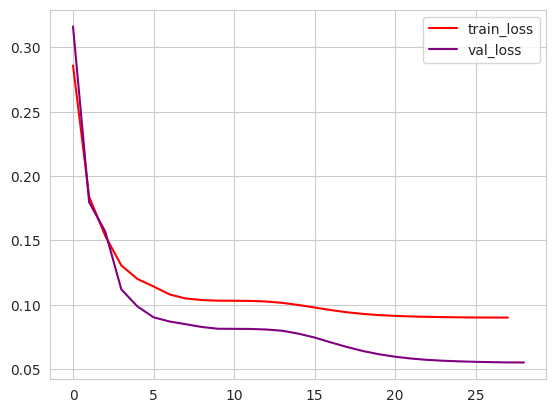

In [50]:
plot_history(model.history,"loss")

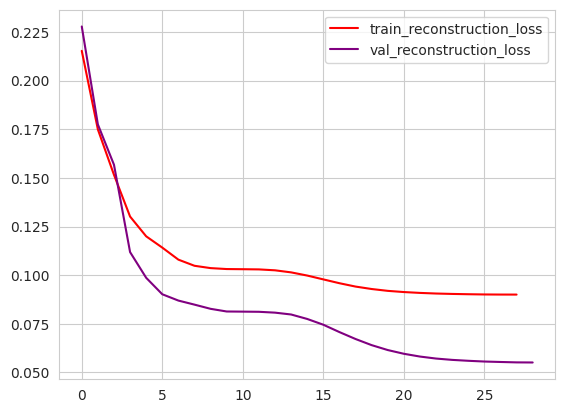

In [51]:
plot_history(model.history,"reconstruction_loss")

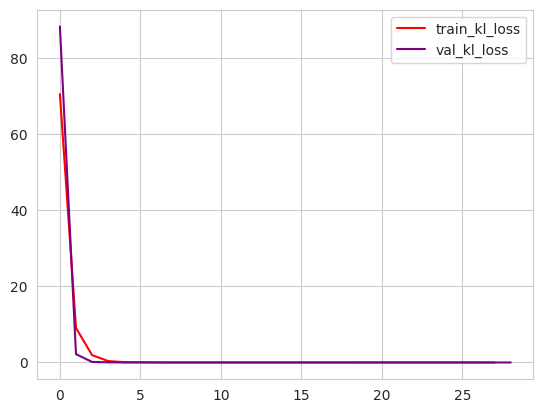

In [52]:
plot_history(model.history,"kl_loss")

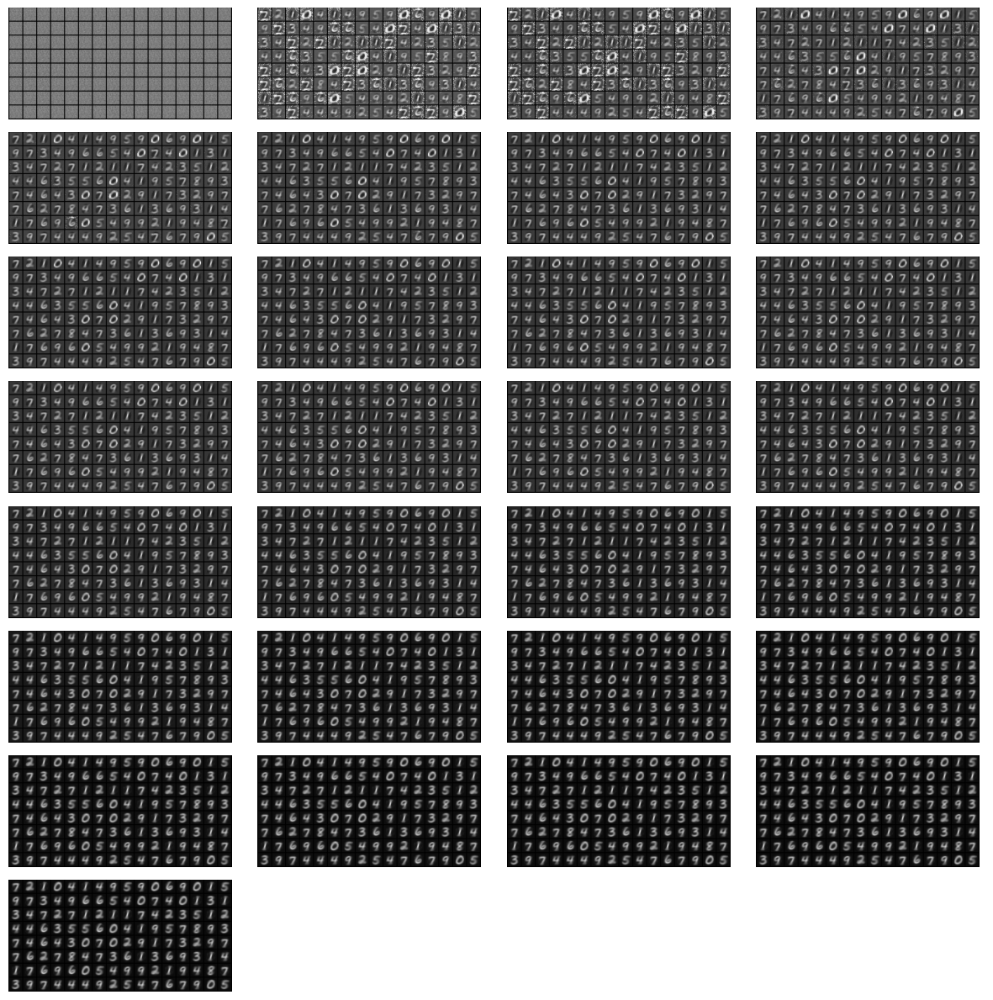

In [53]:
gen_images=model.history['generated_images']

gen_images=torch.stack(gen_images).cpu()

cols = 4
rows =  len(gen_images) // cols + int(len(gen_images) % cols != 0)
fig, axes = plt.subplots(rows,cols, figsize=(12,12))
axes = axes.flatten()  # Flatten axes for easy iteration

for i, images in enumerate(gen_images):
    grid = images
    axes[i].imshow(grid.permute(1, 2, 0))
    axes[i].axis('off')

for j in range(i + 1, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [30]:
# sns.set_style("white")

<ipython-input-54-fca660ce12cb>:13: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1)


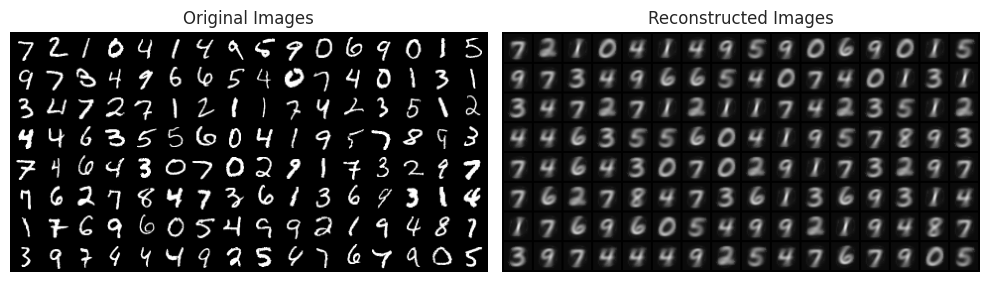

In [54]:
with torch.no_grad():
  model.eval()
  for images,labels in valid_dl:
    # images=images.to(DEVICE)
    # labels=labels.to(DEVICE)
    out,z_mean, z_log_var = model(images,labels)
    plt.figure(figsize=(10,12))
    plt.grid('off')

    out_grid=make_grid(out,nrow=16)
    img_grid=make_grid(images,16)

    plt.subplot(1,2,1)
    plt.imshow(img_grid.permute(1,2,0))
    plt.axis('off')
    plt.title("Original Images")

    plt.subplot(1,2,2)
    plt.imshow(out_grid.permute(1,2,0))
    plt.axis('off')
    plt.title("Reconstructed Images")

    plt.tight_layout()
    plt.show()

    break
  model.train()

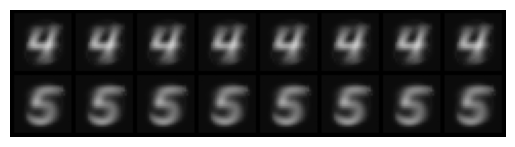

In [55]:
with torch.no_grad():
  model.eval()
  fakes=torch.randn(16,latent_dim).to(DEVICE)
  # labels=torch.randint(0,10,(8,)).to(DEVICE)
  labels=torch.tensor([4]*8+[5]*8).to(DEVICE)
  reconstructed_img=model.decode(fakes,labels)
  out=model.decoder(reconstructed_img.to('cpu'))
  out=out.view(out.shape[0],1,28,28)

  plt.grid(False)
  plt.axis('off')

  out_grid=make_grid(out.detach().cpu(),)

  plt.imshow(out_grid.permute(1,2,0))